In [12]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN

In [2]:
f = open("aggregate_trajectory.csv")
data = pd.read_csv(f, header=None, names=["latitude", "longitude", "0", "altitude", "t", "date", "time"], parse_dates=["time"])
f.close()
data_beijing = data.loc[(data["latitude"] > 39) & (data["longitude"] < 118 )]
data_beijing.head()

C:\Users\20191696\AppData\Local\Temp\ipykernel_16432\586008672.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data = pd.read_csv(f, header=None, names=["latitude", "longitude", "0", "altitude", "t", "date", "time"], parse_dates=["time"])


,latitude,longitude,0,altitude,t,date,time
0,39.984702,116.318417,0,492,39744.120185,2008-10-23,2023-05-30 02:53:04
1,39.984683,116.318450,0,492,39744.120255,2008-10-23,2023-05-30 02:53:10
2,39.984686,116.318417,0,492,39744.120313,2008-10-23,2023-05-30 02:53:15
3,39.984688,116.318385,0,492,39744.120370,2008-10-23,2023-05-30 02:53:20
4,39.984655,116.318263,0,492,39744.120428,2008-10-23,2023-05-30 02:53:25


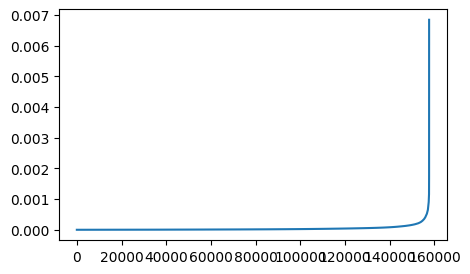

In [10]:
# Trying to read of good epsilon value for DBSCAN
from sklearn.neighbors import NearestNeighbors

test_data = data_beijing.loc[:, ["latitude", "longitude"]]
neighb = NearestNeighbors(n_neighbors=2)
nbrs=neighb.fit(test_data)
distances,indices=nbrs.kneighbors(test_data)

distances = np.sort(distances, axis = 0)
distances = distances[:, 1]
plt.plot(distances)
plt.show()

In [19]:
NR_OF_INTERVALS = 24*6
PERCENTAGE_OVERLAP = 10

df = data_beijing[["latitude", "longitude", "t"]]
df["t"] = df["t"] % 1
df["t"] -= min(df["t"])

max_t = max(df["t"])
overlap = (max_t / NR_OF_INTERVALS) * (PERCENTAGE_OVERLAP / 100)

# Initialize figure:
fig = go.Figure()


for i in range(NR_OF_INTERVALS):
    lb = i/NR_OF_INTERVALS * max_t - overlap
    ub = (i+1)/NR_OF_INTERVALS * max_t + overlap
    
    df_interval = df.loc[(df["t"] >= lb) & (df["t"] <= ub)]

    # If current slice is empty, continue (DBSCAN requires non-empty data)
    if df_interval.shape[0] == 0:
        continue

    dbscan = DBSCAN(eps = 0.005, min_samples = 4).fit(df_interval.loc[:, ["latitude", "longitude"]].values)
    
    # Add slice of data to figure:
    fig.add_trace(
        go.Scatter(
            visible=False,
            x=df_interval["latitude"].to_numpy(),
            y=df_interval["longitude"].to_numpy(),
            mode="markers",
            marker=dict(color=dbscan.labels_)
        )
    )
    


# Set the first trace of the figure as visible
fig.data[0].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)}]
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=0,
    currentvalue={"prefix": "Slice: "},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

C:\Users\20191696\AppData\Local\Temp\ipykernel_16432\2552870921.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\20191696\AppData\Local\Temp\ipykernel_16432\2552870921.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

